In [42]:
import json
import glob
import time
import sqlite3
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sqlite3 import Error

In [2]:
def create_connection(path):
    connection = None
    try:
        connection = sqlite3.connect(path)
        print("Connection to SQLite DB successful")
    except Error as e:
        print(f"The error '{e}' occurred")

    return connection

def execute_query(connection, query):
    cursor = connection.cursor()
    try:
        cursor.execute(query)
        connection.commit()
        print("Query executed successfully")
    except Error as e:
        print(f"The error '{e}' occurred")

def execute_read_query(connection, query):
    cursor = connection.cursor()
    result = None
    try:
        cursor.execute(query)
        result = cursor.fetchall()
        return result
    except Error as e:
        print(f"The error '{e}' occurred")

def change_single_tuple_to_list(list_tuple):
    lista = []
    for item in list_tuple:
        lista.append(item[0])
    return lista

In [3]:
#connection = create_connection("D:\SQLServer\PUBG_Data_June.sqlite")
#connection = create_connection("C:\PUBG_SQLServer\PUBG_Data_June.sqlite")
#connection = create_connection("G:\PUBG_SQLServer\PUBG_Data_June.sqlite")
connection = create_connection("G:\PUBG_SQLServer\\New_PUBG_Data.sqlite")

Connection to SQLite DB successful


In [7]:
create_matches_table = """
CREATE TABLE IF NOT EXISTS matches (
  id INTEGER PRIMARY KEY AUTOINCREMENT,
  matchId TEXT,
  createdAt TEXT,
  shardId TEXT,
  isCustomMatch BIT,
  matchType TEXT,
  duration INTEGER,
  gameMode TEXT,
  titleId TEXT,
  mapName TEXT,
  seasonState TEXT,
  assetsId TEXT,
  rosterId TEXT,
  participantId TEXT,
  DBNO INTEGER,
  assists INTEGER,
  boosts INTEGER,
  damageDealt INTEGER,
  deathType TEXT,
  headshotKills INTEGER,
  heals INTEGER,
  killPlace INTEGER,
  killStreaks INTEGER,
  kills INTEGER,
  longestKill INTEGER,
  name TEXT,
  playerId TEXT,
  revives INTEGER,
  rideDistance INTEGER,
  roadKills INTEGER,
  swimDistance INTEGER,
  teamKills INTEGER,
  timeSurvived FLOAT,
  vehicleDestroys INTEGER,
  walkDistance FLOAT,
  weaponsAcquired INTEGER,
  winPlace INTEGER
);
"""

execute_query(connection, create_matches_table)

Query executed successfully


In [8]:
lifetime_types = ['lifetimeDuo', 'lifetimeDuofpp', 'lifetimeSolo', 'lifetimeSolofpp', 'lifetimeSquad', 'lifetimeSquadfpp']
for item in lifetime_types:
  create_table = """
  CREATE TABLE IF NOT EXISTS """ + item + """ (
    player_id TEXT PRIMARY KEY,
    assists INTEGER,
    boosts INTEGER,
    dBNOs INTEGER,
    dailyKills INTEGER,
    dailyWins INTEGER,
    damageDealt FLOAT,
    days INTEGER,
    headshotKills INTEGER,
    heals INTEGER,
    killPoints FLOAT,
    kills INTEGER,
    longestKill FLOAT,
    longestTimeSurvived FLOAT,
    losses INTEGER,
    maxKillStreaks INTEGER,
    mostSurvivalTime FLOAT,
    rankPoints FLOAT,
    rankPointsTitle TEXT,
    revives INTEGER,
    rideDistance FLOAT,
    roadKills INTEGER,
    roundMostKills INTEGER,
    roundsPlayed INTEGER,
    suicides INTEGER,
    swimDistance FLOAT,
    teamKills INTEGER,
    timeSurvived FLOAT,
    top10s INTEGER,
    vehicleDestroys INTEGER,
    walkDistance FLOAT,
    weaponsAcquired INTEGER,
    weeklyKills INTEGER,
    weeklyWins INTEGER,
    winPoints FLOAT,
    wins INTEGER
  );
  """
  execute_query(connection, create_table)

#lifetimeDuo, lifetimeDuofpp, lifetimeSolo, lifetimeSolofpp, lifetimeSquad, lifetimeSquadfpp
#"player_id": '', "assists": 47, "boosts": 132, "dBNOs": 156, "dailyKills": 13, "dailyWins": 0, "damageDealt": 24697.324, "days": 23, "headshotKills": 44, "heals": 247, "killPoints": 0, "kills": 185, "longestKill": 378.50623, "longestTimeSurvived": 1862.383, "losses": 104, "maxKillStreaks": 4, "mostSurvivalTime": 1862.383, "rankPoints": 0, "rankPointsTitle": "", "revives": 18, "rideDistance": 67380.76, "roadKills": 0, "roundMostKills": 10, "roundsPlayed": 110, "suicides": 3, "swimDistance": 125.00333, "teamKills": 4, "timeSurvived": 77146.55, "top10s": 34, "vehicleDestroys": 0, "walkDistance": 145127.92, "weaponsAcquired": 408, "weeklyKills": 13, "weeklyWins": 0, "winPoints": 0, "wins": 7
#(player_id, assists, boosts, dBNOs, dailyKills, dailyWins, damageDealt, days, headshotKills, heals, killPoints, kills, longestKill, longestTimeSurvived, losses, maxKillStreaks, mostSurvivalTime, rankPoints, rankPointsTitle, revives, rideDistance, roadKills, roundMostKills, roundsPlayed, suicides, swimDistance, teamKills, timeSurvived, top10s, vehicleDestroys, walkDistance, weaponsAcquired, weeklyKills, weeklyWins, winPoints, wins)

#(player_id, assists, boosts, dBNOs, dailyKills, dailyWins, damageDealt, days, headshotKills, heals, killPoints, kills, longestKill, longestTimeSurvived, losses, maxKillStreaks, mostSurvivalTime,rankPoints, rankPointsTitle, revives, rideDistance, roadKills, roundMostKills, roundsPlayed, suicides, swimDistance, teamKills, timeSurvived, top10s, vehicleDestroys, walkDistance, weaponsAcquired, weeklyKills, weeklyWins, winPoints, wins)

#"assists": 0, "boosts": 0, "dBNOs": 0, "dailyKills": 0, "dailyWins": 0, "damageDealt": 0, "days": 0, "headshotKills": 0, "heals": 0, "killPoints": 0, "kills": 0, "longestKill": 0, "longestTimeSurvived": 0, "losses": 0, "maxKillStreaks": 0, "mostSurvivalTime": 0, "rankPoints": 0, "rankPointsTitle": "", "revives": 0, "rideDistance": 0, "roadKills": 0, "roundMostKills": 0, "roundsPlayed": 0, "suicides": 0, "swimDistance": 0, "teamKills": 0, "timeSurvived": 0, "top10s": 0, "vehicleDestroys": 0, "walkDistance": 0, "weaponsAcquired": 0,"weeklyKills": 0, "weeklyWins": 0, "winPoints": 0, "wins": 0

Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully


In [87]:
create_table = """
CREATE TABLE IF NOT EXISTS parachuteLanding (
  id INTEGER PRIMARY KEY AUTOINCREMENT,
  matchId TEXT,
  mapName TEXT,
  weatherId TEXT,
  accountId TEXT,
  locationX FLOAT,
  locationY FLOAT,
  locationZ FLOAT,
  distance FLOAT
);
"""
execute_query(connection, create_table)

Query executed successfully


In [88]:
create_table = """
CREATE TABLE IF NOT EXISTS itemPickup (
  id INTEGER PRIMARY KEY AUTOINCREMENT,
  matchId TEXT,
  mapName TEXT,
  accountId TEXT,
  locationX FLOAT,
  locationY FLOAT,
  locationZ FLOAT,
  isInBlueZone BIT,
  isInRedZone BIT,
  isGame FLOAT,
  itemId TEXT,
  category TEXT,
  subCategory TEXT,
  stackCount INTEGER
);
"""
execute_query(connection, create_table)

Query executed successfully


In [89]:
create_table = """
CREATE TABLE IF NOT EXISTS itemUse (
  id INTEGER PRIMARY KEY AUTOINCREMENT,
  matchId TEXT,
  mapName TEXT,
  accountId TEXT,
  health FLOAT,
  locationX FLOAT,
  locationY FLOAT,
  locationZ FLOAT,
  isInBlueZone BIT,
  isInRedZone BIT,
  isGame FLOAT,
  itemId TEXT,
  category TEXT,
  subCategory TEXT,
  stackCount INTEGER
);
"""
execute_query(connection, create_table)

Query executed successfully


In [90]:
#only for winners
create_table = """
CREATE TABLE IF NOT EXISTS matchWinners (
    id INTEGER PRIMARY KEY AUTOINCREMENT,
    matchId TEXT,
    mapName TEXT,
    cameraView TEXT,
    teamSize INTEGER,
    userId TEXT,
    health FLOAT,
    killCount INTEGER,
    distanceOnFoot FLOAT, 
    distanceOnSwim FLOAT,
    distanceOnVehicle FLOAT,
    distanceOnParachute FLOAT,
    distanceOnFreefall  FLOAT,
    primaryWeaponFirst TEXT,
    primaryWeaponSecond TEXT,
    secondaryWeapon TEXT
);
"""
execute_query(connection, create_table)

Query executed successfully


In [91]:
create_table = """
CREATE TABLE IF NOT EXISTS topTens (
    id INTEGER PRIMARY KEY AUTOINCREMENT,
    matchId TEXT,
    mapName TEXT,
    cameraView TEXT,
    teamSize INTEGER,
    userId TEXT,
    ranking INTEGER,
    primaryWeaponFirst TEXT,
    primaryWeaponSecond TEXT,
    secondaryWeapon TEXT
);
"""
execute_query(connection, create_table)

Query executed successfully


In [5]:
current_tables = """
SELECT 
    name
FROM 
    sqlite_master 
WHERE 
    type ='table' AND 
    name NOT LIKE 'sqlite_%';
"""
execute_read_query(connection, current_tables)

[('matches',),
 ('lifetimeDuo',),
 ('lifetimeDuofpp',),
 ('lifetimeSolo',),
 ('lifetimeSolofpp',),
 ('lifetimeSquad',),
 ('lifetimeSquadfpp',),
 ('parachuteLanding',),
 ('itemPickup',),
 ('itemUse',),
 ('matchWinners',),
 ('topTens',)]

In [8]:
create_player = """
INSERT INTO
  matches (matchId, createdAt, shardId, isCustomMatch, matchType, duration, gameMode, titleId, mapName, seasonState, assetsId, rosterId, participantId, DBNO, assists, boosts, damageDealt, deathType, headshotKills, heals, killPlace, killStreaks, kills, longestKill, name, playerId, revives, rideDistance, roadKills, swimDistance, teamKills, timeSurvived, vehicleDestroys, walkDistance, weaponsAcquired, winPlace)
VALUES
  ('52b12013-08c1-4771-9a71-b94af170f314', '2021-05-17T05:42:05Z', 'steam', 0, 'official', 1113, 'duo-fpp', 'bluehole-pubg', 'Chimera_Main', 'progress', '7814d730-b6d5-11eb-a941-ca2a434581ce', '0938671e-dc57-492e-9f8b-c57982847084', '929abe4a-eca9-48e1-8b9a-cac47b87aed9', 0, 0, 0, 0, 'byplayer', 0, 0, 64, 0, 0, 0, 'TicklerSan', 'account.04ce57f62b594b6bb4793963226831ab', 0, 0, 0, 0, 0, 72.207, 0, 16.446335, 0, 31);
"""
#('52b12013-08c1-4771-9a71-b94af170f314', '2021-05-17T05:42:05Z', 'steam', 0, 'official', 1113, 'duo-fpp', 'bluehole-pubg', 'Chimera_Main', 'progress', '7814d730-b6d5-11eb-a941-ca2a434581ce', '0938671e-dc57-492e-9f8b-c57982847084', '929abe4a-eca9-48e1-8b9a-cac47b87aed9', 0, 0, 0, 0, 'byplayer', 0, 0, 64, 0, 0, 0, 'TicklerSan', 'account.04ce57f62b594b6bb4793963226831ab', 0, 0, 0, 0, 0, 72.207, 0, 16.446335, 0, 31);
#(matchId, createdAt, shardId, isCustomMatch, matchType, duration, gameMode, titleId, mapName, seasonState, assetsId, rosterId, participantId, DBNO, assists, boosts, damageDealt, deathType, headshotKills, heals, killPlace, killStreaks, kills, longestKill, name, playerId, revives, rideDistance, roadKills, swimDistance, teamKills, timeSurvived, vehicleDestroys, walkDistance, weaponsAcquired, winPlace)
execute_query(connection, create_player)

Query executed successfully


In [4]:
files = glob.glob("G:/PUBG_SQLServer/Matches/*")
print(len(files), " OK")

84326  OK


In [17]:
part = files[40000:60000]
tam = len(part)
print("tam = ", tam)

tam =  20000


In [16]:
first_part = """
INSERT INTO
  matches (matchId, createdAt, shardId, isCustomMatch, matchType, duration, gameMode, titleId, mapName, seasonState, assetsId, rosterId, participantId, DBNO, assists, boosts, damageDealt, deathType, headshotKills, heals, killPlace, killStreaks, kills, longestKill, name, playerId, revives, rideDistance, roadKills, swimDistance, teamKills, timeSurvived, vehicleDestroys, walkDistance, weaponsAcquired, winPlace)
VALUES
  ('"""
last_part = """);"""

for aux in part:
    with open(aux) as f:
        rosters = {}
        data = json.load(f)

        for roster in data['included']:
            if roster['type'] == 'roster':
                for player in roster['relationships']['participants']['data']:
                    rosters[player['id']] = roster['id'] #{playerid: rosterid}

        for player in data['included']:
            if player['type'] == 'participant':
                if data['data']['attributes']['isCustomMatch'] == True:
                    custom_match = 1
                else:
                    custom_match = 0
                infos = first_part + str(data['data']['id']) + """', '""" + str(data['data']['attributes']['createdAt']) + """', '""" + str(data['data']['attributes']['shardId']) + """', """ + str(custom_match) + """, '""" + str(data['data']['attributes']['matchType']) + """', """ + str(data['data']['attributes']['duration']) + """, '""" + str(data['data']['attributes']['gameMode']) + """', '""" + str(data['data']['attributes']['titleId']) + """', '""" + str(data['data']['attributes']['mapName']) + """', '""" + str(data['data']['attributes']['seasonState']) + """', '""" + str(data['data']['relationships']['assets']['data'][0]['id']) + """', '""" + str(rosters.get(player['id'])) + """', '""" + str(player['id']) + """', """ + str(player['attributes']['stats']['DBNOs']) + """, """ + str(player['attributes']['stats']['assists']) + """, """ + str(player['attributes']['stats']['boosts']) + """, """ + str(player['attributes']['stats']['damageDealt']) + """, '""" + str(player['attributes']['stats']['deathType']) + """', """ + str(player['attributes']['stats']['headshotKills']) + """, """ + str(player['attributes']['stats']['heals']) + """, """ + str(player['attributes']['stats']['killPlace']) + """, """ + str(player['attributes']['stats']['killStreaks']) + """, """ + str(player['attributes']['stats']['kills']) + """, """ + str(player['attributes']['stats']['longestKill']) + """, '""" + str(player['attributes']['stats']['name']) + """', '""" + str(player['attributes']['stats']['playerId']) + """', """ + str(player['attributes']['stats']['revives']) + """, """ + str(player['attributes']['stats']['rideDistance']) + """, """ + str(player['attributes']['stats']['roadKills']) + """, """ + str(player['attributes']['stats']['swimDistance']) + """, """ + str(player['attributes']['stats']['teamKills']) + """, """ + str(player['attributes']['stats']['timeSurvived']) + """, """ + str(player['attributes']['stats']['vehicleDestroys']) + """, """ + str(player['attributes']['stats']['walkDistance']) + """, """ + str(player['attributes']['stats']['weaponsAcquired']) + """, """ + str(player['attributes']['stats']['winPlace']) + last_part
                #print(infos)
                execute_query(connection, infos)
    print("File OK: ", aux)
    tam = tam-1
    print(tam, " left")

cessfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query exec

In [8]:
distinct_mapiDs = change_single_tuple_to_list(execute_read_query(connection, "SELECT DISTINCT matchId from matches"))
len(distinct_mapiDs)

53718

Evaluating The Data

● Spots with more weapon and items spawns;

● Spots where most players land;

● Chances of survival if landing on a spot;

● Various statistics (average shots per match, average traveled distance...);

● Average players per match (yes, they have bots now);

● Top 10 players average stats (items picked up, weapons used, if they use
vehicles...).

Averages

In [7]:
import numpy as np
import matplotlib.pyplot as plt

In [40]:
aux = change_single_tuple_to_list(execute_read_query(connection, "SELECT COUNT(*) FROM matches"))
total_matches = aux[0]
print("Total lines: ", total_matches)

Total lines:  3902016


In [41]:
duration = execute_read_query(connection, "SELECT duration from matches")

In [42]:
maps_names = change_single_tuple_to_list(execute_read_query(connection, "SELECT DISTINCT mapName from matches"))

In [73]:
maps_names = ['Baltic_Main', 'Desert_Main', 'Savage_Main', 'DihorOtok_Main']

"Baltic_Main": "Erangel (Remastered)",

"Chimera_Main": "Paramo",

"Desert_Main": "Miramar",

"DihorOtok_Main": "Vikendi",

"Erangel_Main": "Erangel",

"Heaven_Main": "Haven",

"Range_Main": "Camp Jackal",

"Savage_Main": "Sanhok",

"Summerland_Main": "Karakin"

In [79]:
columns = ['DBNO', 'assists', 'boosts', 'damageDealt', 'headshotKills', 'heals', 'killStreaks', 'kills', 'longestKill', 'revives', 'rideDistance', 'roadKills', 'swimDistance', 'teamKills', 'timeSurvived', 'vehicleDestroys', 'walkDistance', 'weaponsAcquired']
averages_list = []
for name in columns:
    averages_dict = {}
    lenMatches = 0
    sumMatches = 0
    for map in maps_names:
        per_maps = change_single_tuple_to_list(execute_read_query(connection, "SELECT " + name + " from matches WHERE mapName='" + map + "'"))
        print("Average " + name + " " + map + ": " + "{:.3f}".format(sum(per_maps)/len(per_maps)))
        lenMatches = lenMatches + len(per_maps)
        sumMatches = sumMatches + sum(per_maps)
        averages_dict[map] = str(sum(per_maps)/len(per_maps))
    averages_dict = {'Data': name, 'total_avg': sumMatches/lenMatches}
    print("Average " + name + ": " + "{:.3f}".format(sumMatches/lenMatches))
    averages_list.append(averages_dict)

df_avg = pd.DataFrame(averages_list)

Average DBNO Baltic_Main: 0.696
Average DBNO Desert_Main: 0.671
Average DBNO Savage_Main: 0.632
Average DBNO DihorOtok_Main: 0.653
Average DBNO: 0.665
Average assists Baltic_Main: 0.246
Average assists Desert_Main: 0.231
Average assists Savage_Main: 0.203
Average assists DihorOtok_Main: 0.212
Average assists: 0.225
Average boosts Baltic_Main: 1.903
Average boosts Desert_Main: 1.920
Average boosts Savage_Main: 1.108
Average boosts DihorOtok_Main: 1.303
Average boosts: 1.604
Average damageDealt Baltic_Main: 154.198
Average damageDealt Desert_Main: 150.812
Average damageDealt Savage_Main: 153.087
Average damageDealt DihorOtok_Main: 147.296
Average damageDealt: 151.516
Average headshotKills Baltic_Main: 0.245
Average headshotKills Desert_Main: 0.225
Average headshotKills Savage_Main: 0.246
Average headshotKills DihorOtok_Main: 0.254
Average headshotKills: 0.242
Average heals Baltic_Main: 1.961
Average heals Desert_Main: 1.724
Average heals Savage_Main: 1.084
Average heals DihorOtok_Main: 1

In [87]:
game_mode = ['solo', 'solo-fpp', 'duo', 'duo-fpp', 'squad', 'squad-fpp']
columns = ['DBNO', 'assists', 'boosts', 'damageDealt', 'headshotKills', 'heals', 'killStreaks', 'kills', 'longestKill', 'revives', 'rideDistance', 'roadKills', 'swimDistance', 'teamKills', 'timeSurvived', 'vehicleDestroys', 'walkDistance', 'weaponsAcquired']
averages_list = []
for name in columns:
    averages_dict = {}
    lenMatches = 0
    sumMatches = 0
    for mode in game_mode:
        for map in maps_names:
            per_maps = change_single_tuple_to_list(execute_read_query(connection, "SELECT " + name + " from matches WHERE mapName='" + map + "' AND gameMode='" + mode + "'"))
            print("Average " + name + " " + map + " " + mode + ": " + "{:.3f}".format(sum(per_maps)/len(per_maps)))
            lenMatches = lenMatches + len(per_maps)
            sumMatches = sumMatches + sum(per_maps)
            averages_dict[map] = str(sum(per_maps)/len(per_maps))
        averages_dict = {'Data': name, 'total_avg': sumMatches/lenMatches}
        print("Average " + name + ": " + "{:.3f}".format(sumMatches/lenMatches))
        averages_list.append(averages_dict)

df_avg = pd.DataFrame(averages_list)

Average DBNO Baltic_Main solo: 0.000
Average DBNO Desert_Main solo: 0.000
Average DBNO Savage_Main solo: 0.000
Average DBNO DihorOtok_Main solo: 0.000
Average DBNO: 0.000
Average DBNO Baltic_Main solo-fpp: 0.000
Average DBNO Desert_Main solo-fpp: 0.000
Average DBNO Savage_Main solo-fpp: 0.000
Average DBNO DihorOtok_Main solo-fpp: 0.000
Average DBNO: 0.000
Average DBNO Baltic_Main duo: 0.595
Average DBNO Desert_Main duo: 0.588
Average DBNO Savage_Main duo: 0.555
Average DBNO DihorOtok_Main duo: 0.557
Average DBNO: 0.042
Average DBNO Baltic_Main duo-fpp: 0.604
Average DBNO Desert_Main duo-fpp: 0.604
Average DBNO Savage_Main duo-fpp: 0.587
Average DBNO DihorOtok_Main duo-fpp: 0.601
Average DBNO: 0.337
Average DBNO Baltic_Main squad: 0.806
Average DBNO Desert_Main squad: 0.813
Average DBNO Savage_Main squad: 0.784
Average DBNO DihorOtok_Main squad: 0.805
Average DBNO: 0.532
Average DBNO Baltic_Main squad-fpp: 0.861
Average DBNO Desert_Main squad-fpp: 0.869
Average DBNO Savage_Main squad-fp

KeyboardInterrupt: 

Boxplots

In [10]:
data = [change_single_tuple_to_list(execute_read_query(connection, "SELECT kills from matches WHERE mapName='Baltic_Main' AND gameMode='solo'")), change_single_tuple_to_list(execute_read_query(connection, "SELECT kills from matches WHERE mapName='Baltic_Main' AND gameMode='solo-fpp'")), change_single_tuple_to_list(execute_read_query(connection, "SELECT kills from matches WHERE mapName='Baltic_Main' AND gameMode='duo'")), change_single_tuple_to_list(execute_read_query(connection, "SELECT kills from matches WHERE mapName='Baltic_Main' AND gameMode='duo-fpp'")), change_single_tuple_to_list(execute_read_query(connection, "SELECT kills from matches WHERE mapName='Baltic_Main' AND gameMode='squad'")), change_single_tuple_to_list(execute_read_query(connection, "SELECT kills from matches WHERE mapName='Baltic_Main' AND gameMode='squad-fpp'"))]

In [5]:
label = ['solo', 'solo-fpp', 'duo', 'duo-fpp', 'squad', 'squad-fpp']

{'whiskers': [<matplotlib.lines.Line2D at 0xe0d5a10>,
 'caps': [<matplotlib.lines.Line2D at 0xe0fd4d0>,
 'boxes': [<matplotlib.lines.Line2D at 0xe0d5810>,
 'medians': [<matplotlib.lines.Line2D at 0xe0fd990>,
 'fliers': [<matplotlib.lines.Line2D at 0xe0fdbb0>,
 'means': []}

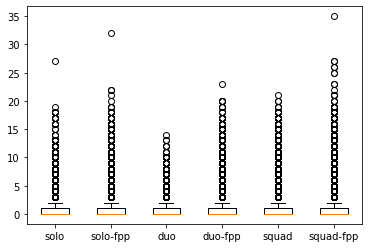

In [11]:
fig1, ax1 = plt.subplots()
ax1.boxplot(data, labels=label)

In [77]:
df_avg.head()

,Data,total_avg
0,DBNO,0.736481
1,assists,0.250045
2,boosts,1.731380
3,damageDealt,167.210091
4,headshotKills,0.264792


In [14]:
df_avg_trans = df_avg.set_index('Data').T
df_avg_trans

Data,DBNO,assists,boosts,damageDealt,headshotKills,heals,killStreaks,kills,longestKill,revives,rideDistance,roadKills,swimDistance,teamKills,timeSurvived,vehicleDestroys,walkDistance,weaponsAcquired
total_avg,0.656618,0.22293,1.543631,149.078027,0.236078,1.535272,0.53907,1.023433,25.409961,0.1476,789.832508,0.004483,18.043144,0.006857,17037.832181,0.01334,1047.642014,3.604123
Baltic_Main,0.6956554651109979,0.2458373915632554,1.902568165646432,154.19804811379635,0.244563654072276,1.9614003037995125,0.5343005798432556,1.0106289457349475,28.321003186221986,0.16847045524508344,1331.7836102475126,0.008047154528984593,44.53435071706017,0.007996689493684301,789.855320039152,0.016163950806683588,1118.770769976041,3.7407056021235685
Savage_Main,0.6321910646637559,0.2032334505025667,1.107538237627612,153.08701329716445,0.24600547490319088,1.083929687951535,0.5666130735644141,1.1500830167662341,18.873053628186536,0.12097329277071084,132.3308156092818,0.0016117337368578679,25.770089493829083,0.005899181917056793,559.050785790464,0.012310650840938825,911.8848002884724,3.5350772108468234
Chimera_Main,0.6205417225332233,0.21994884264695114,1.1025040842556049,130.67870411251806,0.20278613145874208,1.0490287425542821,0.5167599669724493,0.9228018877214778,23.173138161458606,0.13606694391628982,22.924709393310547,0.00016665277893508876,1.53414740690801e-05,0.004060267704963981,161530.99395513217,0.000222203705246785,838.9767925392641,3.147396807841771
Range_Main,0.03274568784982675,0.0,0.16620340402848113,104.09819009970015,0.020370863953089898,0.07607660967901611,0.012146365609412482,0.05414461409587633,0.35876878180558186,0.010927921410349161,65.55179092583089,0.0,0.5924996072840117,0.007729505387807943,613.2726306210241,0.0,21.30830695953893,4.081407303049918
Desert_Main,0.6706701039371626,0.2306295201199086,1.919616603736496,150.81245783279405,0.225476685805083,1.7241682569844299,0.5414274364623689,0.9838524731147568,31.05325647208971,0.16185817368727118,1296.7376292978802,0.005279786719959375,3.7704313561912732,0.007125715642993456,796.819399260208,0.021443694560703726,1193.69265451541,3.732038282293006
DihorOtok_Main,0.6526207728663516,0.21226560364768388,1.3032510515755302,147.2956537656777,0.2537993373907595,1.4921693453234053,0.5445808029970736,1.050646277322632,22.91558688325941,0.13928792837954043,512.3300333122202,0.004092978608520595,3.9491423966994517,0.0074220234246365315,676.321835830204,0.007511349016418577,1047.4914503592179,3.5529134141707717
Summerland_Main,0.4940047961630695,0.0,1.9016786570743405,132.28644766618714,0.1750599520383693,1.6786570743405276,0.5323741007194245,0.8165467625899281,19.3426566738609,0.2158273381294964,28.076854448441242,0.001199040767386091,2.0137458033573137,0.004796163069544364,517.589400479617,0.0,962.9172153589939,2.470023980815348


In [20]:
game_modes = ['tdm', 'squad-fpp', 'squad', 'solo', 'duo-fpp', 'normal-solo', 'solo-fpp', 'duo', 'lab-tpp', 'normal-squad-fpp', 'normal-duo-fpp', 'normal-solo-fpp', 'normal-squad', 'war-solo-fpp', 'war-squad', 'esports-squad-fpp', 'zombie-duo-fpp', 'esports-duo-fpp', 'war-solo', 'zombie-squad', 'esports-solo-fpp', 'war-duo-fpp', 'war-squad-fpp', 'conquest-squad', 'normal-duo', 'conquest-squad-fpp', 'esports-squad', 'war-duo', 'esports-duo', 'zombie-squad-fpp', 'zombie-solo']
keep = ['solo', 'solo-fpp', 'duo', 'duo-fpp', 'squad', 'squad-fpp']
drop_ids = []
for mode in game_modes:
    distinct_gameMode = change_single_tuple_to_list(execute_read_query(connection, "SELECT id FROM matches WHERE gameMode='" + str(mode) + "'"))
    if mode not in keep:
        drop_ids.append(distinct_gameMode)
    print(mode, str(len(distinct_gameMode)))

tdm 34292
squad-fpp 1760638
squad 836046
solo 185656
duo-fpp 629708
normal-solo 1191
solo-fpp 354457
duo 42868
lab-tpp 41050
normal-squad-fpp 1783
normal-duo-fpp 747
normal-solo-fpp 1228
normal-squad 2161
war-solo-fpp 600
war-squad 208
esports-squad-fpp 7941
zombie-duo-fpp 10
esports-duo-fpp 360
war-solo 144
zombie-squad 96
esports-solo-fpp 114
war-duo-fpp 88
war-squad-fpp 105
conquest-squad 46
normal-duo 104
conquest-squad-fpp 181
esports-squad 110
war-duo 46
esports-duo 14
zombie-squad-fpp 19
zombie-solo 5


In [24]:
total = 0
for aux in drop_ids:
    total = total + len(aux)
total

92643

In [16]:
files = glob.glob("G:/PUBG_SQLServer/Lifetime/*")
print(len(files), " OK")

8517  OK


In [20]:
first = files[:1000]
tamanho = len(first)

In [21]:
tables = [['lifetimeDuo', 'lifetimeDuofpp', 'lifetimeSolo', 'lifetimeSolofpp', 'lifetimeSquad', 'lifetimeSquadfpp']]
first_part_solo = """INSERT INTO """
table_stuff = """ (player_id, assists, boosts, dBNOs, dailyKills, dailyWins, damageDealt, days, headshotKills, heals, killPoints, kills, longestKill, longestTimeSurvived, losses, maxKillStreaks, mostSurvivalTime, rankPoints, rankPointsTitle, revives, rideDistance, roadKills, roundMostKills, roundsPlayed, suicides, swimDistance, teamKills, timeSurvived, top10s, vehicleDestroys, walkDistance, weaponsAcquired, weeklyKills, weeklyWins, winPoints, wins)
VALUES
  ('"""
last_part = """);"""


for player in first:
  with open(player) as f:
    data = json.load(f)
    player_id = data['data']['relationships']['player']['data']['id']
    tables.append([data['data']['attributes']['gameModeStats']['duo'], data['data']['attributes']['gameModeStats']['duo-fpp'], data['data']['attributes']['gameModeStats']['solo'], data['data']['attributes']['gameModeStats']['solo-fpp'], data['data']['attributes']['gameModeStats']['squad'], data['data']['attributes']['gameModeStats']['squad-fpp']])
    
    for (tabela, modo) in zip(tables[0], tables[1]):
      infos = first_part_solo + tabela + table_stuff + str(player_id) + """', """ + str(modo['assists']) + """, """ + str(modo['boosts']) + """, """ + str(modo['dBNOs']) + """, """ + str(modo['dailyKills']) + """, """ + str(modo['dailyWins']) + """, """ + str(modo['damageDealt']) + """, """ + str(modo['days']) + """, """ + str(modo['headshotKills']) + """, """ + str(modo['heals']) + """, """ + str(modo['killPoints']) + """, """ + str(modo['kills']) + """, """ + str(modo['longestKill']) + """, """ + str(modo['longestTimeSurvived']) + """, """ + str(modo['losses']) + """, """ + str(modo['maxKillStreaks']) + """, """ + str(modo['mostSurvivalTime']) + """, """ + str(modo['rankPoints']) + """, '""" + str(modo['rankPointsTitle']) + """', """ + str(modo['revives']) + """, """ + str(modo['rideDistance']) + """, """ + str(modo['roadKills']) + """, """ + str(modo['roundMostKills']) + """, """ + str(modo['roundsPlayed']) + """, """ + str(modo['suicides']) + """, """ + str(modo['swimDistance']) + """, """ + str(modo['teamKills']) + """, """ + str(modo['timeSurvived']) + """, """ + str(modo['top10s']) + """, """ + str(modo['vehicleDestroys']) + """, """ + str(modo['walkDistance']) + """, """ + str(modo['weaponsAcquired']) + """, """ + str(modo['weeklyKills']) + """, """ + str(modo['weeklyWins']) + """, """ + str(modo['winPoints']) + """, """ + str(modo['wins']) + last_part

      #print(infos)
      execute_query(connection, infos)
  print("File OK: ", player)
  tamanho = tamanho-1
  print(tamanho, " files left")

ccount.1cce6dd23d874d8d9d6e872844ccda00.json
75  files left
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
File OK:  G:/PUBG_SQLServer/Lifetime\account.1cdcd47a09384103a12ec0af8fa6578d.json
74  files left
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
File OK:  G:/PUBG_SQLServer/Lifetime\account.1ce0bfc450584f1b9ae9952c9bf94f1a.json
73  files left
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
File OK:  G:/PUBG_SQLServer/Lifetime\account.1ce33ff50ac34d9fbee7badaef6c95dc.json
72  files left
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Qu

In [15]:
amount_player = change_single_tuple_to_list(execute_read_query(connection, "SELECT COUNT(*) FROM lifetimeSolofpp"))
print("Total lines: ", amount_player)

Total lines:  [8517]


In [20]:
columns = ['assists', 'boosts', 'dBNOs', 'damageDealt', 'headshotKills', 'heals', 'kills', 'losses', 'revives', 'rideDistance', 'roundsPlayed', 'swimDistance', 'timeSurvived', 'top10s', 'vehicleDestroys', 'walkDistance', 'wins']
tables = ['lifetimeSolo', 'lifetimeSolofpp', 'lifetimeDuo', 'lifetimeDuofpp', 'lifetimeSquad', 'lifetimeSquadfpp']
total_lines = 8517

averages_list = []
for name in columns:
    for table in tables:
        players = change_single_tuple_to_list(execute_read_query(connection, "SELECT " + name + " FROM " + table))
        soma = sum(players)
        media = soma/total_lines
        averages_list.append(media)
        print(name + " " + table + ": " + "{:.2f}".format(media))

assists lifetimeSolo: 2.65
assists lifetimeSolofpp: 28.24
assists lifetimeDuo: 3.53
assists lifetimeDuofpp: 5.23
assists lifetimeSquad: 6.18
assists lifetimeSquadfpp: 4.29
boosts lifetimeSolo: 140.33
boosts lifetimeSolofpp: 1434.67
boosts lifetimeDuo: 28.24
boosts lifetimeDuofpp: 55.65
boosts lifetimeSquad: 40.60
boosts lifetimeSquadfpp: 13.22
dBNOs lifetimeSolo: 0.00
dBNOs lifetimeSolofpp: 0.00
dBNOs lifetimeDuo: 2.65
dBNOs lifetimeDuofpp: 16.00
dBNOs lifetimeSquad: 11.47
dBNOs lifetimeSquadfpp: 6.52
damageDealt lifetimeSolo: 6092.08
damageDealt lifetimeSolofpp: 58519.95
damageDealt lifetimeDuo: 735.12
damageDealt lifetimeDuofpp: 3202.84
damageDealt lifetimeSquad: 2509.97
damageDealt lifetimeSquadfpp: 905.26
headshotKills lifetimeSolo: 7.94
headshotKills lifetimeSolofpp: 95.32
headshotKills lifetimeDuo: 0.00
headshotKills lifetimeDuofpp: 10.18
headshotKills lifetimeSquad: 3.53
headshotKills lifetimeSquadfpp: 1.17
heals lifetimeSolo: 104.15
heals lifetimeSolofpp: 1466.33
heals lifetime

Evaluate telemetry data

In [8]:
files = glob.glob("G:/PUBG_SQLServer/Telemetry/*")
print(len(files), " OK")

4229  OK


In [10]:
already_in = change_single_tuple_to_list(execute_read_query(connection, "SELECT DISTINCT matchId from parachuteLanding"))

In [14]:
to_add = []
for match in files:
    with open(match) as f:
        data = json.load(f)
    if data[0]['MatchId'] not in already_in:
        to_add.append(match)
print(len(to_add))

2969


In [6]:
first = files[1500:2000]
tamanho = len(first)

NameError: name 'files' is not defined

In [7]:
for match in first:
    with open(match) as f:
        data = json.load(f)
    map_name = ''
    weather_id = ''
    for log in data:
        if log['_T'] == 'LogMatchStart':
            map_name = log['mapName']
            weather_id = log['weatherId']
            camera_view = log['cameraViewBehaviour']
            team_size = log['teamSize']
    for log in data:
        if log['_T'] == 'LogParachuteLanding':
            infos = """INSERT INTO parachuteLanding (matchId, mapName, weatherId, accountId, locationX, locationY, locationZ, distance)
VALUES
  ('""" + str(data[0]['MatchId']) + """', '""" + str(map_name) + """', '""" + str(weather_id) + """', '""" + str(log['character']['accountId']) + """', """ + str(log['character']['location']['x']) + """, """ + str(log['character']['location']['y']) + """, """ + str(log['character']['location']['z']) + """, """ + str(log['distance']) + """);"""
            execute_query(connection, infos)
            #print(infos)

        if log['_T'] == 'LogItemPickup':
            if log['character']['isInBlueZone'] == 'true':
                blue = 1
            else:
                blue = 0
            if log['character']['isInRedZone'] == 'true':
                red = 1
            else:
                red = 0
            infos = """INSERT INTO itemPickup (matchId, mapName, accountId, locationX, locationY, locationZ, isInBlueZone, isInRedZone, isGame, itemId, category, subCategory, stackCount)
VALUES
  ('""" + str(data[0]['MatchId']) + """', '""" + str(map_name) + """', '""" + str(log['character']['accountId']) + """', """ + str(log['character']['location']['x']) + """, """ + str(log['character']['location']['y']) + """, """ + str(log['character']['location']['z']) + """, """ + str(blue) + """, """ + str(red) + """, """ + str(log['common']['isGame']) + """, '""" + str(log['item']['itemId']) + """', '""" + str(log['item']['category']) + """', '""" + str(log['item']['subCategory']) + """', """ + str(log['item']['stackCount']) + """);"""
            execute_query(connection, infos)
            #print(infos)

        if log['_T'] == 'LogItemUse':
            if log['character']['isInBlueZone'] == 'true':
                blue = 1
            else:
                blue = 0
            if log['character']['isInRedZone'] == 'true':
                red = 1
            else:
                red = 0
            infos = """INSERT INTO itemUse (matchId, mapName, accountId, health, locationX, locationY, locationZ, isInBlueZone, isInRedZone, isGame, itemId, category, subCategory, stackCount)
VALUES
  ('""" + str(data[0]['MatchId']) + """', '""" + str(map_name) + """', '""" + str(log['character']['accountId']) + """', """ + str(log['character']['health']) + """, """ + str(log['character']['location']['x']) + """, """ + str(log['character']['location']['y']) + """, """ + str(log['character']['location']['z']) + """, """ + str(blue) + """, """ + str(red) + """, """ + str(log['common']['isGame']) + """, '""" + str(log['item']['itemId']) + """', '""" + str(log['item']['category']) + """', '""" + str(log['item']['subCategory']) + """', """ + str(log['item']['stackCount']) + """);"""
            execute_query(connection, infos)
#            print(infos)

        if log['_T'] == 'LogMatchEnd':
            for winner in log['gameResultOnFinished']['results']:
                id = winner['accountId']
                for player in log['characters']:
                    if player['character']['accountId'] == id:
                        infos = """INSERT INTO matchWinners (matchId, mapName, cameraView, teamSize, userId, health, killCount, distanceOnFoot, distanceOnSwim, distanceOnVehicle, distanceOnParachute, distanceOnFreefall, primaryWeaponFirst, primaryWeaponSecond, secondaryWeapon)
VALUES
  ('""" + str(data[0]['MatchId']) + """', '""" + str(map_name) + """', '""" + str(camera_view) + """', """ + str(team_size) + """, '""" + str(id) + """', """ + str(player['character']['health']) + """, """ + str(winner['stats']['killCount']) + """, """ + str(winner['stats']['distanceOnFoot']) + """, """ + str(winner['stats']['distanceOnSwim']) + """, """ + str(winner['stats']['distanceOnVehicle']) + """, """ + str(winner['stats']['distanceOnParachute']) + """, """ + str(winner['stats']['distanceOnFreefall']) + """, '""" + str(player['primaryWeaponFirst']) + """', '""" + str(player['primaryWeaponSecond']) + """', '""" + str(player['secondaryWeapon']) + """');"""
                        execute_query(connection, infos)
#                        print(infos)
            #second part: top tens
            for player in log['characters']:
                if player['character']['ranking'] < 11:
                    infos = """INSERT INTO topTens (matchId, mapName, cameraView, teamSize, userId, ranking, primaryWeaponFirst, primaryWeaponSecond, secondaryWeapon)
VALUES
  ('""" + str(data[0]['MatchId']) + """', '""" + str(map_name) + """', '""" + str(camera_view) + """', """ + str(team_size) + """, '""" + str(player['character']['accountId']) + """', """ + str(player['character']['ranking']) + """, '""" + str(player['primaryWeaponFirst']) + """', '""" + str(player['primaryWeaponSecond'])  + """', '""" + str(player['secondaryWeapon']) + """');"""
                    execute_query(connection, infos)
#                    print(infos)

    tamanho = tamanho-1
    print(tamanho, "left")
    print(match, ' done')

NameError: name 'first' is not defined

In [21]:
tables = ['parachuteLanding', 'itemPickup', 'itemUse', 'matchWinners', 'topTens']
for table in tables:
    amount = change_single_tuple_to_list(execute_read_query(connection, "SELECT COUNT(*) FROM " + str(table)))
    print(table, str(amount))

parachuteLanding [142433]
itemPickup [3344648]
itemUse [303687]
matchWinners [3455]
topTens [32225]


In [ ]:
maps_names = ['Baltic_Main', 'Desert_Main', 'Savage_Main', 'DihorOtok_Main']

In [35]:
aux = change_single_tuple_to_list(execute_read_query(connection, "SELECT DISTINCT mapName from parachuteLanding"))
print(aux)

['Baltic_Main', 'DihorOtok_Main', 'Chimera_Main', 'Desert_Main', 'Savage_Main', 'Summerland_Main']


In [114]:
x_pos = change_single_tuple_to_list(execute_read_query(connection, "SELECT locationX from parachuteLanding WHERE mapName='DihorOtok_Main'"))
y_pos = change_single_tuple_to_list(execute_read_query(connection, "SELECT locationY from parachuteLanding WHERE mapName='DihorOtok_Main'"))

In [115]:
x_pos_aux = x_pos[:1000]
y_pos_aux = y_pos[:1000]
x_np = np.array(x_pos_aux)
y_np = np.array(y_pos_aux)

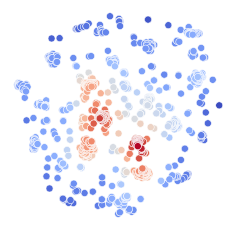

In [116]:
from scipy.stats import gaussian_kde

# Generate fake data
#x = np.random.normal(size=1000)
#y = x * 3 + np.random.normal(size=1000)

# Calculate the point density
xy = np.vstack([x_np,y_np])
z = gaussian_kde(xy)(xy)

# Sort the points by density, so that the densest points are plotted last
idx = z.argsort()
x_np, y_np, z = x_np[idx], y_np[idx], z[idx]

fig, ax = plt.subplots()
sns.set_style("white")
ax = sns.scatterplot(x=x_np, y=y_np, c=z, s=50, cmap='coolwarm')
ax.invert_yaxis()
sns.despine(top=True, right=True, left=True, bottom=True)
ax.set_aspect('equal')
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.show()

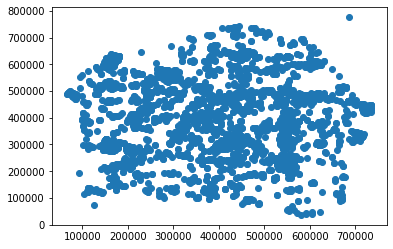

In [41]:
fig, ax = plt.subplots()
ax.scatter(x_np, y_np)
plt.show()

In [129]:
quant_events = change_single_tuple_to_list(execute_read_query(connection, "SELECT COUNT(*) FROM parachuteLanding"))
distance = change_single_tuple_to_list(execute_read_query(connection, "SELECT distance from parachuteLanding"))

In [146]:
print("Average distance in parachute: " + str(sum(distance)/quant_events[0]))

Average distance in parachute: 257.02145619820664


In [22]:
count_pickup = change_single_tuple_to_list(execute_read_query(connection, "SELECT COUNT(*) FROM ItemPickup"))
print("Total lines: ", count_pickup)

Total lines:  [3344648]


In [23]:
subcateg = change_single_tuple_to_list(execute_read_query(connection, "SELECT DISTINCT subCategory from ItemPickup"))
categ = change_single_tuple_to_list(execute_read_query(connection, "SELECT DISTINCT category from ItemPickup"))
item_id = change_single_tuple_to_list(execute_read_query(connection, "SELECT DISTINCT itemId from ItemPickup"))
print(subcateg)
print(categ)
print(item_id)

['Backpack', 'Throwable', 'Sight', 'Vest', 'None', 'Heal', 'Boost', 'Handgun', 'Headgear', 'Main', 'Melee', 'Fuel', 'Gadget', 'Parachute']
['Equipment', 'Attachment', 'Use', 'Weapon', 'Ammunition']
['Item_Back_B_01_StartParachutePack_C', 'Item_Back_E_01_Lv1_C', 'Item_Weapon_Grenade_C', 'Item_Attach_Weapon_Upper_Holosight_C', 'Item_Armor_D_01_Lv2_C', 'Item_Attach_Weapon_Stock_SniperRifle_CheekPad_C', 'Item_Heal_MedKit_C', 'Item_Boost_EnergyDrink_C', 'Item_Weapon_M1911_C', 'Item_Head_E_01_Lv1_C', 'Item_Heal_Bandage_C', 'Item_Ammo_45ACP_C', 'Item_Attach_Weapon_Upper_Scope3x_C', 'Item_Weapon_UMP_C', 'Item_Weapon_SmokeBomb_C', 'Item_Weapon_AK47_C', 'Item_Ammo_762mm_C', 'Item_Weapon_Berreta686_C', 'Item_Ammo_12Guage_C', 'Item_Back_F_01_Lv2_C', 'Item_Heal_FirstAid_C', 'Item_Weapon_BerylM762_C', 'Item_Weapon_Winchester_C', 'Item_Weapon_NagantM1895_C', 'Item_Ammo_9mm_C', 'Item_Attach_Weapon_Muzzle_FlashHider_SniperRifle_C', 'Item_Attach_Weapon_Muzzle_FlashHider_Medium_C', 'Item_Weapon_M9_C', 'I

In [148]:
categ = change_single_tuple_to_list(execute_read_query(connection, "SELECT COUNT(*) category from ItemPickup"))
per_maps = change_single_tuple_to_list(execute_read_query(connection, "SELECT " + categ[0] + " from ItemPickup WHERE category='" + map + "'"))

['Equipment', 'Ammunition', 'Weapon', 'Attachment', 'Use']

In [152]:
per_maps = change_single_tuple_to_list(execute_read_query(connection, "SELECT category from ItemPickup WHERE category='Ammunition'"))
#per_maps = change_single_tuple_to_list(execute_read_query(connection, "SELECT DBNO from matches WHERE mapName='Desert_Main'"))

In [27]:
weapons_ids = ['Item_Weapon_Grenade_C', 'Item_Weapon_M1911_C', 'Item_Weapon_UMP_C', 'Item_Weapon_SmokeBomb_C', 'Item_Weapon_AK47_C', 'Item_Weapon_Berreta686_C', 'Item_Weapon_BerylM762_C', 'Item_Weapon_Winchester_C', 'Item_Weapon_NagantM1895_C', 'Item_Weapon_M9_C', 'Item_Weapon_Mini14_C', 'Item_Weapon_Saiga12_C', 'Item_Weapon_Pan_C', 'Item_Weapon_BizonPP19_C', 'Item_Weapon_SKS_C', 'Item_Weapon_Cowbar_C', 'Item_Weapon_UZI_C', 'Item_Weapon_HK416_C', 'Item_Weapon_Vector_C', 'Item_Weapon_Thompson_C', 'Item_Weapon_Mk47Mutant_C', 'Item_Weapon_FlashBang_C', 'Item_Weapon_Machete_C', 'Item_Weapon_M16A4_C', 'Item_Weapon_M249_C', 'Item_Weapon_Molotov_C', 'Item_Weapon_VSS_C', 'Item_Weapon_DP12_C', 'Item_Weapon_SCAR-L_C', 'Item_Weapon_M24_C', 'Item_Weapon_G18_C', 'Item_Weapon_DP28_C', 'Item_Weapon_C4_C', 'Item_Weapon_SpikeTrap_C', 'Item_Weapon_FNFal_C', 'Item_Weapon_Mosin_C', 'Item_Weapon_Sickle_C', 'Item_Weapon_Kar98k_C', 'Item_Weapon_FlareGun_C', 'Item_Weapon_MG3_C', 'Item_Weapon_Mk14_C', 'Item_Weapon_AWM_C', 'Item_Weapon_Groza_C', 'Item_Weapon_DesertEagle_C', 'Item_Weapon_vz61Skorpion_C', 'Item_Weapon_G36C_C', 'Item_Weapon_MP5K_C', 'Item_Weapon_Crossbow_C', 'Item_Weapon_AUG_C', 'Item_Weapon_PanzerFaust100M_C', 'Item_Weapon_Snowball_C', 'Item_Weapon_Sawnoff_C', 'Item_Weapon_Rhino_C', 'Item_Weapon_Win1894_C', 'Item_Weapon_DecoyGrenade_C', 'Item_Weapon_L6_C', 'Item_Weapon_QBU88_C', 'Item_Weapon_QBZ95_C', 'Item_Weapon_Julies_Kar98k_C', 'Item_Weapon_Lunchmeats_AK47_C', 'Item_Weapon_Apple_C', 'Item_Weapon_Duncans_M416_C', 'Item_Weapon_Mads_QBU88_C', 'Item_Weapon_StickyGrenade_C']
heals_ids = ['Item_Heal_Bandage_C', 'Item_Heal_FirstAid_C', 'Item_Heal_MedKit_C', 'Item_Boost_PainKiller_C', 'Item_Boost_EnergyDrink_C', 'Item_Boost_AdrenalineSyringe_C']
backpacks_ids = ['Item_Back_E_01_Lv1_C', 'Item_Back_E_02_Lv1_C', 'Item_Back_F_01_Lv2_C', 'Item_Back_F_02_Lv2_C', 'Item_Back_B_08_Lv3_C','Item_Back_C_01_Lv3_C', 'Item_Back_C_02_Lv3_C']
armor_ids = ['Item_Armor_E_01_Lv1_C', 'Item_Armor_D_01_Lv2_C', 'Item_Armor_C_01_Lv3_C']
head_ids = ['Item_Head_E_01_Lv1_C', 'Item_Head_F_01_Lv2_C', 'Item_Head_E_02_Lv1_C', 'Item_Head_F_02_Lv2_C', 'Item_Head_G_01_Lv3_C']

In [29]:
category = ['Equipment', 'Ammunition', 'Weapon', 'Attachment', 'Use']
subcategory = ['Backpack', 'None', 'Main', 'Throwable', 'Heal', 'Vest', 'Sight', 'Melee', 'Boost', 'Headgear', 'Handgun', 'Gadget', 'Fuel', 'Parachute']

In [30]:
total_weapon = []
for item in weapons_ids:
    total_weapon.append(change_single_tuple_to_list(execute_read_query(connection, "SELECT COUNT(*) itemId from ItemPickup WHERE itemId='"+ str(item) + "'")))

In [219]:
for item, value in zip(weapons_ids, total_weapon):
    print(item, ": ", value)

Item_Weapon_Berreta686_C :  [785]
Item_Weapon_SmokeBomb_C :  [10436]
Item_Weapon_Mini14_C :  [1156]
Item_Weapon_Winchester_C :  [1216]
Item_Weapon_BerylM762_C :  [1866]
Item_Weapon_MP5K_C :  [589]
Item_Weapon_UMP_C :  [1786]
Item_Weapon_Pan_C :  [2542]
Item_Weapon_Crossbow_C :  [113]
Item_Weapon_M16A4_C :  [2222]
Item_Weapon_UZI_C :  [1175]
Item_Weapon_Molotov_C :  [3744]
Item_Weapon_G36C_C :  [601]
Item_Weapon_Mosin_C :  [448]
Item_Weapon_M24_C :  [1003]
Item_Weapon_HK416_C :  [3225]
Item_Weapon_Mk47Mutant_C :  [766]
Item_Weapon_FlashBang_C :  [3298]
Item_Weapon_vz61Skorpion_C :  [355]
Item_Weapon_VSS_C :  [385]
Item_Weapon_DP12_C :  [385]
Item_Weapon_Grenade_C :  [7807]
Item_Weapon_M9_C :  [760]
Item_Weapon_BizonPP19_C :  [366]
Item_Weapon_Thompson_C :  [677]
Item_Weapon_M1911_C :  [574]
Item_Weapon_AK47_C :  [2912]
Item_Weapon_SpikeTrap_C :  [294]
Item_Weapon_SKS_C :  [1354]
Item_Weapon_Kar98k_C :  [1135]
Item_Weapon_DesertEagle_C :  [175]
Item_Weapon_Sickle_C :  [252]
Item_Weapon_C

In [31]:
total_heals = []
for item in heals_ids:
    total_heals.append(change_single_tuple_to_list(execute_read_query(connection, "SELECT COUNT(*) itemId from ItemPickup WHERE itemId='"+ str(item) + "'")))

In [32]:
for item, value in zip(heals_ids, total_heals):
    print(item, ": ", value)

Item_Heal_Bandage_C :  [125035]
Item_Heal_FirstAid_C :  [163929]
Item_Heal_MedKit_C :  [10762]
Item_Boost_PainKiller_C :  [126002]
Item_Boost_EnergyDrink_C :  [167483]
Item_Boost_AdrenalineSyringe_C :  [11815]


In [33]:
total_backpacks = []
for item in backpacks_ids:
    total_backpacks.append(change_single_tuple_to_list(execute_read_query(connection, "SELECT COUNT(*) itemId from ItemPickup WHERE itemId='"+ str(item) + "'")))

In [34]:
for item, value in zip(backpacks_ids, total_backpacks):
    print(item, ": ", value)

Item_Back_E_01_Lv1_C :  [27502]
Item_Back_E_02_Lv1_C :  [18040]
Item_Back_F_01_Lv2_C :  [28504]
Item_Back_F_02_Lv2_C :  [27498]
Item_Back_B_08_Lv3_C :  [128]
Item_Back_C_01_Lv3_C :  [2589]
Item_Back_C_02_Lv3_C :  [24974]


In [224]:
total_armor = []
for item in armor_ids:
    total_armor.append(change_single_tuple_to_list(execute_read_query(connection, "SELECT COUNT(*) itemId from ItemPickup WHERE itemId='"+ str(item) + "'")))

In [225]:
for item, value in zip(armor_ids, total_armor):
    print(item, ": ", value)

Item_Armor_E_01_Lv1_C :  [4923]
Item_Armor_D_01_Lv2_C :  [7344]
Item_Armor_C_01_Lv3_C :  [2302]


In [226]:
total_head = []
for item in head_ids:
    total_head.append(change_single_tuple_to_list(execute_read_query(connection, "SELECT COUNT(*) itemId from ItemPickup WHERE itemId='"+ str(item) + "'")))

In [227]:
for item, value in zip(head_ids, total_head):
    print(item, ": ", value)

Item_Head_E_01_Lv1_C :  [2419]
Item_Head_F_01_Lv2_C :  [3966]
Item_Head_E_02_Lv1_C :  [2835]
Item_Head_F_02_Lv2_C :  [3910]
Item_Head_G_01_Lv3_C :  [996]


In [ ]:
maps_names = ['Baltic_Main', 'Desert_Main', 'Savage_Main', 'DihorOtok_Main']

In [136]:
#most common weapon for each map
total_weapon = []
for item in weapons_ids:
    total_weapon.append(change_single_tuple_to_list(execute_read_query(connection, "SELECT COUNT(*) itemId from ItemPickup WHERE mapName='Savage_Main' AND itemId='"+ str(item) + "'")))
for item, value in zip(weapons_ids, total_weapon):
    print(item, ": ", value)

Item_Weapon_Berreta686_C :  [929]
Item_Weapon_SmokeBomb_C :  [7904]
Item_Weapon_Mini14_C :  [1]
Item_Weapon_Winchester_C :  [768]
Item_Weapon_BerylM762_C :  [3147]
Item_Weapon_MP5K_C :  [19]
Item_Weapon_UMP_C :  [4090]
Item_Weapon_Pan_C :  [3853]
Item_Weapon_Crossbow_C :  [111]
Item_Weapon_M16A4_C :  [4504]
Item_Weapon_UZI_C :  [1628]
Item_Weapon_Molotov_C :  [3467]
Item_Weapon_G36C_C :  [0]
Item_Weapon_Mosin_C :  [0]
Item_Weapon_M24_C :  [988]
Item_Weapon_HK416_C :  [6703]
Item_Weapon_Mk47Mutant_C :  [1225]
Item_Weapon_FlashBang_C :  [4683]
Item_Weapon_vz61Skorpion_C :  [225]
Item_Weapon_VSS_C :  [438]
Item_Weapon_DP12_C :  [603]
Item_Weapon_Grenade_C :  [12837]
Item_Weapon_M9_C :  [369]
Item_Weapon_BizonPP19_C :  [3]
Item_Weapon_Thompson_C :  [1498]
Item_Weapon_M1911_C :  [363]
Item_Weapon_AK47_C :  [5897]
Item_Weapon_SpikeTrap_C :  [838]
Item_Weapon_SKS_C :  [1921]
Item_Weapon_Kar98k_C :  [2569]
Item_Weapon_DesertEagle_C :  [663]
Item_Weapon_Sickle_C :  [404]
Item_Weapon_C4_C :  [64

In [137]:
x_pos = change_single_tuple_to_list(execute_read_query(connection, "SELECT locationX from itemPickup WHERE mapName='Savage_Main' AND itemId='Item_Weapon_HK416_C'"))
y_pos = change_single_tuple_to_list(execute_read_query(connection, "SELECT locationY from itemPickup WHERE mapName='Savage_Main' AND itemId='Item_Weapon_HK416_C'"))

In [138]:
x_pos_aux = x_pos[:1000]
y_pos_aux = y_pos[:1000]
x_np = np.array(x_pos_aux)
y_np = np.array(y_pos_aux)

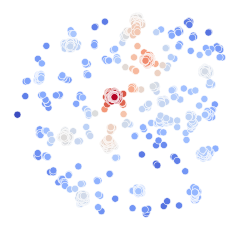

In [139]:
# Calculate the point density
xy = np.vstack([x_np,y_np])
z = gaussian_kde(xy)(xy)

# Sort the points by density, so that the densest points are plotted last
idx = z.argsort()
x_np, y_np, z = x_np[idx], y_np[idx], z[idx]

fig, ax = plt.subplots()
sns.set_style("white")
ax = sns.scatterplot(x=x_np, y=y_np, c=z, s=50, cmap='coolwarm')
ax.invert_yaxis()
sns.despine(top=True, right=True, left=True, bottom=True)
ax.set_aspect('equal')
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.show()

In [ ]:
#averages from winners
matchWinners (matchId, mapName, cameraView, teamSize, userId, health, killCount, distanceOnFoot, distanceOnSwim, distanceOnVehicle, distanceOnParachute, distanceOnFreefall, primaryWeaponFirst, primaryWeaponSecond, secondaryWeapon)

In [164]:
camera_view = change_single_tuple_to_list(execute_read_query(connection, "SELECT DISTINCT secondaryWeapon from matchWinners WHERE mapName='Baltic_Main'"))
camera_view

['',
 'WeapM1911_C',
 'WeapNagantM1895_C',
 'WeapDesertEagle_C',
 'WeapM9_C',
 'WeapFlareGun_C',
 'Weapvz61Skorpion_C',
 'WeapG18_C',
 'WeapSawnoff_C']

In [152]:
aux = change_single_tuple_to_list(execute_read_query(connection, "SELECT COUNT(*) secondaryWeapon from matchWinners WHERE mapName='Baltic_Main'"))
aux

[58]

In [ ]:
maps_names = ['Baltic_Main', 'Desert_Main', 'Savage_Main', 'DihorOtok_Main']

In [160]:
primary_weapons = ['', 'WeapGroza_C', 'WeapMk14_C', 'WeapBerylM762_C', 'WeapHK416_C', 'WeapMosinNagant_C', 'WeapMini14_C', 'WeapG36C_C', 'WeapFNFal_C', 'WeapMP5K_C', 'WeapM24_C', 'WeapSKS_C', 'WeapVector_C', 'WeapUMP_C', 'WeapM249_C', 'WeapAK47_C', 'WeapBizonPP19_C', 'WeapMG3_C', 'WeapKar98k_C', 'WeapSCAR-L_C', 'WeapVSS_C', 'WeapMk47Mutant_C', 'WeapUZI_C', 'WeapThompson_C', 'WeapWin94_C', 'WeapAWM_C', 'WeapAUG_C', 'WeapQBU88_C', 'WeapM16A4_C', 'WeapDP12_C', 'WeapJuliesKar98k_C', 'WeapQBZ95_C', 'WeapWinchester_C', 'WeapDP28_C', 'WeapSaiga12_C', 'WeapDuncansHK416_C', 'WeapLunchmeatsAK47_C', 'WeapL6_C']
secondary_weapons = ['', 'WeapM1911_C', 'Weapvz61Skorpion_C', 'WeapM9_C', 'WeapNagantM1895_C', 'WeapG18_C', 'WeapDesertEagle_C', 'WeapFlareGun_C', 'WeapSawnoff_C', 'WeapRhino_C']

In [176]:
#most common weapon for each map
weapons_win = ['primaryWeaponFirst', 'primaryWeaponSecond', 'secondaryWeapon']
total_weapon = []
for item in primary_weapons:
    total_weapon.append(change_single_tuple_to_list(execute_read_query(connection, "SELECT COUNT(*) primaryWeaponSecond from matchWinners WHERE mapName='DihorOtok_Main' AND primaryWeaponSecond='"+ str(item) + "'")))
for item, value in zip(weapons_ids, total_weapon):
    if value[0] > 10:
        print(item, ": ", value)

Item_Weapon_Berreta686_C :  [158]
Item_Weapon_Mini14_C :  [17]
Item_Weapon_Winchester_C :  [28]
Item_Weapon_BerylM762_C :  [45]
Item_Weapon_MP5K_C :  [31]
Item_Weapon_UMP_C :  [32]
Item_Weapon_Pan_C :  [11]
Item_Weapon_Crossbow_C :  [69]
Item_Weapon_M16A4_C :  [21]
Item_Weapon_UZI_C :  [127]
Item_Weapon_Molotov_C :  [38]
Item_Weapon_Mosin_C :  [14]
Item_Weapon_HK416_C :  [11]
Item_Weapon_vz61Skorpion_C :  [49]
Item_Weapon_M1911_C :  [21]


In [183]:
stats = ['health', 'killCount', 'distanceOnFoot', 'distanceOnSwim', 'distanceOnVehicle', 'distanceOnParachute', 'distanceOnFreefall']
maps_names = ['Baltic_Main', 'Desert_Main', 'Savage_Main', 'DihorOtok_Main']
camera_view = ['FpsOnly', 'FpsAndTps']
team_size = [1, 2, 4]
for size in team_size:
    for stat in stats:        
        for map in maps_names:
            aux = change_single_tuple_to_list(execute_read_query(connection, "SELECT " + stat + " from matchWinners WHERE mapName='" + map + "' AND teamSize='" + str(size) + "'"))
            print(stat, size, map, "{:.2f}".format(sum(aux)/len(aux)))

health 1 Baltic_Main 88.04
health 1 Desert_Main 75.01
health 1 Savage_Main 73.31
health 1 DihorOtok_Main 77.54
killCount 1 Baltic_Main 5.78
killCount 1 Desert_Main 6.44
killCount 1 Savage_Main 6.80
killCount 1 DihorOtok_Main 7.20
distanceOnFoot 1 Baltic_Main 4340.15
distanceOnFoot 1 Desert_Main 4088.80
distanceOnFoot 1 Savage_Main 4041.22
distanceOnFoot 1 DihorOtok_Main 4254.47
distanceOnSwim 1 Baltic_Main 6.93
distanceOnSwim 1 Desert_Main 3.37
distanceOnSwim 1 Savage_Main 2.02
distanceOnSwim 1 DihorOtok_Main 4.88
distanceOnVehicle 1 Baltic_Main 3651.13
distanceOnVehicle 1 Desert_Main 4957.53
distanceOnVehicle 1 Savage_Main 374.29
distanceOnVehicle 1 DihorOtok_Main 1835.42
distanceOnParachute 1 Baltic_Main 411.57
distanceOnParachute 1 Desert_Main 398.54
distanceOnParachute 1 Savage_Main 352.54
distanceOnParachute 1 DihorOtok_Main 459.61
distanceOnFreefall 1 Baltic_Main 1590.17
distanceOnFreefall 1 Desert_Main 1341.17
distanceOnFreefall 1 Savage_Main 1480.97
distanceOnFreefall 1 DihorOt

AUX

In [104]:
#Deleta entry
tabela = ['lifetimeDuo', 'lifetimeDuofpp', 'lifetimeSolo', 'lifetimeSolofpp', 'lifetimeSquad', 'lifetimeSquadfpp']
id_jogador = """''"""
for item in tabela:
    deleta_entry = """DELETE FROM """ + item + """ WHERE player_id=""" + id_jogador + """;"""
    execute_query(connection, deleta_entry)

Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully


In [86]:
#Deleta table
names = ['parachuteLanding', 'itemPickup', 'itemUse', 'matchWinners', 'topTens']
for nome in names:
    delete_table = """DROP TABLE """ + nome
    #execute_query(connection, delete_table)

Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully
Query executed successfully


In [75]:
#Delete single table
#execute_query(connection, """DROP TABLE topTens""")
#'parachuteLanding', 'itemPickup', 'itemUse', 'matchWinners', 'topTens'

Query executed successfully
